In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd

In [2]:
df = pd.read_csv("input_game.csv")

In [3]:
game_id = df['game_id']
p1_id = df['p1_id']
p2_id = df['p2_id']
p1_action = df['p1_action']
p2_action = df['p2_action']

In [11]:
max_id_1 = p1_id.max()
min_id_1 = p1_id.min()
max_id_1, min_id_1

(201, 1)

In [12]:
max_id_2 = p1_id.max()
min_id_2 = p2_id.min()
max_id_2, min_id_2

(201, 1)

In [14]:
player_dataframes = {}


for player_id in range(1, 202):  
    
    p1_df = df[df['p1_id'] == player_id]
    
    p2_df = df[df['p2_id'] == player_id]
    
    
    player_dataframes[f'player_{player_id}_p1'] = p1_df
    player_dataframes[f'player_{player_id}_p2'] = p2_df


In [19]:
print(player_dataframes['player_157_p1'])

        game_id  p1_id  p2_id p1_action p2_action  turn
290           5    157     64     TRUST     TRUST     1
291           5    157     64     TRUST     TRUST     2
292           5    157     64     TRUST     TRUST     3
293           5    157     64     TRUST     TRUST     4
294           5    157     64     TRUST     TRUST     5
...         ...    ...    ...       ...       ...   ...
180401     3014    157    169     CHEAT     TRUST    64
180402     3014    157    169     CHEAT     TRUST    65
180403     3014    157    169     CHEAT     TRUST    66
180404     3014    157    169     CHEAT     TRUST    67
180405     3014    157    169     CHEAT     TRUST    68

[1549 rows x 6 columns]


In [21]:
print(player_dataframes['player_157_p2']) 

        game_id  p1_id  p2_id p1_action p2_action  turn
21358       361    171    157     TRUST     TRUST     1
21359       361    171    157     TRUST     TRUST     2
21360       361    171    157     TRUST     TRUST     3
21361       361    171    157     TRUST     TRUST     4
21362       361    171    157     CHEAT     TRUST     5
...         ...    ...    ...       ...       ...   ...
142651     2390    153    157     CHEAT     CHEAT    40
142652     2390    153    157     TRUST     CHEAT    41
142653     2390    153    157     TRUST     TRUST    42
142654     2390    153    157     TRUST     TRUST    43
142655     2390    153    157     TRUST     TRUST    44

[204 rows x 6 columns]


In [25]:
merged_dataframes_dict = {}

for player_id in range(1, 202):
    p1_df = player_dataframes[f'player_{player_id}_p1']
    p2_df = player_dataframes[f'player_{player_id}_p2']
    
    p1_df_renamed = p1_df.rename(columns={'p1_id': 'self_id', 'p2_id': 'opponent_id',
                                           'p1_action': 'self_action', 'p2_action': 'opponent_action'})
    
    p2_df_swapped = p2_df.rename(columns={'p2_id': 'self_id', 'p1_id': 'opponent_id',
                                           'p2_action': 'self_action', 'p1_action': 'opponent_action'})
    
    merged_df = pd.concat([p1_df_renamed, p2_df_swapped], ignore_index=True)
    
    merged_dataframes_dict[player_id] = merged_df



In [32]:
merged_df_to_print = merged_dataframes_dict[1]
print(merged_df_to_print)

      game_id  self_id  opponent_id self_action opponent_action  turn
0         365        1          159       CHEAT           TRUST     1
1         365        1          159       CHEAT           CHEAT     2
2         365        1          159       CHEAT           CHEAT     3
3         365        1          159       CHEAT           CHEAT     4
4         365        1          159       CHEAT           CHEAT     5
5         365        1          159       CHEAT           CHEAT     6
6         365        1          159       CHEAT           CHEAT     7
7         365        1          159       CHEAT           CHEAT     8
8         365        1          159       CHEAT           CHEAT     9
9         365        1          159       CHEAT           CHEAT    10
10        365        1          159       CHEAT           CHEAT    11
11        365        1          159       CHEAT           CHEAT    12
12        365        1          159       TRUST           CHEAT    13
13        365       

In [56]:
arrays_dict = {}

for player_id, merged_df in merged_dataframes_dict.items():
    
    player_arrays = {}
    
    grouped_by_game = merged_df.groupby('game_id')
    
    for game_id, game_df in grouped_by_game:
        
        game_arrays = []
        
        for i in range(7, len(game_df)):
            
            self_action = game_df.iloc[i]['self_action']
            opponent_actions = game_df.iloc[i-7:i]['opponent_action'].tolist()
            self_actions = game_df.iloc[i-7:i]['self_action'].tolist()
            
            array = [self_action] + opponent_actions + self_actions
            
            game_arrays.append(array)
        
        player_arrays[game_id] = game_arrays
    
    arrays_dict[player_id] = player_arrays




In [59]:
for player_id, player_arrays in arrays_dict.items():
    print(f"Player {player_id}:")
    for game_id, arrays in player_arrays.items():
        print(f"Game {game_id}:")
        for array in arrays:
            print(array)

Player 1:
Game 76:
[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
[1, 1, 1, 1, 1,

assuming a particular player is using the same strategy along the whole game, i.e. same strategy through all games

In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression


weights_list = []

for player_id, X in arrays_dict.items():
    
    y = np.array([arr[0] for game_id, game_arrays in X.items() for arr in game_arrays])
    
    
    X = np.array([arr[1:] for game_id, game_arrays in X.items() for arr in game_arrays])


    model = LogisticRegression()


    model.fit(X, y)


    coef_dict = {'player_id': player_id, 'coef_0': model.intercept_[0]}
    coef_dict.update({f'coef_{i}': coef for i, coef in enumerate(model.coef_[0], 1)})


    weights_list.append(coef_dict)

weights_df = pd.DataFrame(weights_list)

print(weights_df)

     player_id     coef_0    coef_1    coef_2    coef_3    coef_4    coef_5  \
0            1  -3.506864  0.181553  0.008660  0.194257  0.283152  0.325964   
1            2  -1.867324 -0.169403  0.215821 -0.474100  0.268278  0.004240   
2            3  -2.027652 -0.192540 -0.565877 -0.713063  0.213140  0.019568   
3            4  -2.911201 -0.315052 -0.239957 -0.167546  0.121132 -0.070268   
4            5  -3.379077  0.335875  0.228986 -0.288791 -0.153362  0.440945   
5            6   8.886965  0.228127  0.023611  0.052114  0.325649  0.062974   
6            7  -3.134615  0.216239  0.076581 -0.084459 -0.061183  0.151252   
7            8  10.225994 -0.150568  0.320616 -0.042449 -0.017943  0.244354   
8            9   2.690394  0.274647  0.089578 -0.263603  0.089477  0.548637   
9           10  -0.332282  0.079017 -0.070033 -0.091201 -0.116522 -0.408865   
10          11  -1.130292 -0.112747 -0.172458  0.058290 -0.062932 -0.366389   
11          12   2.176391  0.202520  0.121569  0.004

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\

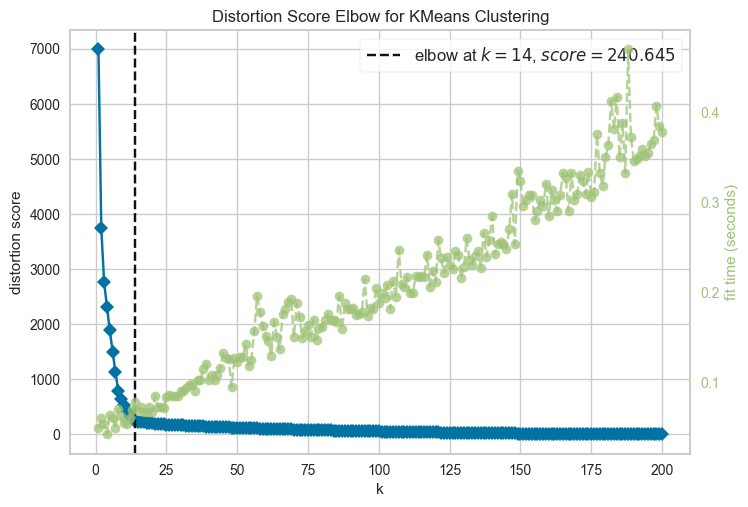

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [69]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Extracting features from weights_df
X = weights_df.drop(columns=['player_id'])

# Instantiating the KMeans model
model = KMeans()

# Instantiating the KElbowVisualizer with the k parameter (k=1 to 201)
visualizer = KElbowVisualizer(model, k=(1, 201))

# Fitting the visualizer to the data
visualizer.fit(X)

# Finalizing and render the figure
visualizer.show()

In [71]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Initializing empty list to store silhouette scores
silhouette_scores = []

# Defining the range of clusters to try
k_range = range(2, 21)  # Adjust the upper bound as needed

# Iterating over different numbers of clusters
for k in k_range:
    # Instantiate the KMeans model
    model = KMeans(n_clusters=k)
    
    # Fit the model to the data
    model.fit(X)
    
    # Compute the silhouette score
    score = silhouette_score(X, model.labels_)
    
    # Append the silhouette score to the list
    silhouette_scores.append(score)

# Find the optimal number of clusters with the highest silhouette score
optimal_k = k_range[silhouette_scores.index(max(silhouette_scores))]
print("Optimal number of clusters:", optimal_k)


c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\

Optimal number of clusters: 14


c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### again the number of the clusters is 14

In [73]:
model = KMeans(n_clusters=optimal_k)

# Fit the model to the data
model.fit(X)

# Create a dictionary to store player IDs for each cluster
cluster_player_ids = defaultdict(list)

# Iterate over players and their cluster labels
for player_id, cluster_label in zip(weights_df['player_id'], model.labels_):
    cluster_player_ids[cluster_label].append(player_id)

# Print the player IDs for each cluster
for cluster_label, player_ids in cluster_player_ids.items():
    print(f"Cluster {cluster_label}: {player_ids}")

Cluster 4: [1, 5, 7, 14, 19, 22, 23, 27, 36, 37, 38, 39, 53, 55, 57, 64, 65, 76, 85, 87, 96, 97, 105, 125, 131, 141, 143, 146, 148, 162, 167, 183, 189, 197, 200]
Cluster 9: [2, 3, 20, 100, 118, 126, 138, 149, 150, 190]
Cluster 13: [4, 15, 25, 33, 108, 110, 111, 115, 129, 136, 155, 158, 172]
Cluster 1: [6, 8, 31, 43, 61, 99, 127, 133, 139, 186, 191, 196]
Cluster 10: [9, 13, 60, 95, 104, 121, 128, 137, 175, 178, 181, 192, 193, 194]
Cluster 8: [10, 11, 28, 41, 44, 75, 106, 112, 130, 135, 153, 163, 164, 198]
Cluster 6: [12, 45, 69, 74, 80, 86, 101, 103, 154, 161, 171, 176, 199]
Cluster 7: [16, 18, 72, 78, 81, 94, 116, 122, 142, 145, 160, 166]
Cluster 12: [17, 35, 46, 47, 51, 52, 63, 70, 82, 107, 134, 165, 177, 195, 201]
Cluster 11: [21, 29, 59, 62, 84, 91, 109, 117, 132, 140]
Cluster 3: [24, 32, 50, 68, 71, 83, 114, 119, 124, 156, 173, 187]
Cluster 2: [26, 40, 48, 49, 54, 66, 90, 98, 102, 120, 123, 147, 151, 170, 184]
Cluster 0: [30, 42, 67, 77, 79, 93, 113, 159, 174, 179, 180]
Cluster 5: 

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [76]:
# defining the cluster arrays 
cluster_dict = {
'Cluster_4': [1, 5, 7, 14, 19, 22, 23, 27, 36, 37, 38, 39, 53, 55, 57, 64, 65, 76, 85, 87, 96, 97, 105, 125, 131, 141, 143, 146, 148, 162, 167, 183, 189, 197, 200],
'Cluster_9': [2, 3, 20, 100, 118, 126, 138, 149, 150, 190],
'Cluster_13': [4, 15, 25, 33, 108, 110, 111, 115, 129, 136, 155, 158, 172],
'Cluster_1': [6, 8, 31, 43, 61, 99, 127, 133, 139, 186, 191, 196],
'Cluster_10': [9, 13, 60, 95, 104, 121, 128, 137, 175, 178, 181, 192, 193, 194],
'Cluster_8': [10, 11, 28, 41, 44, 75, 106, 112, 130, 135, 153, 163, 164, 198],
'Cluster_6': [12, 45, 69, 74, 80, 86, 101, 103, 154, 161, 171, 176, 199],
'Cluster_7': [16, 18, 72, 78, 81, 94, 116, 122, 142, 145, 160, 166], 
'Cluster_12': [17, 35, 46, 47, 51, 52, 63, 70, 82, 107, 134, 165, 177, 195, 201],
'Cluster_11': [21, 29, 59, 62, 84, 91, 109, 117, 132, 140], 
'Cluster_3': [24, 32, 50, 68, 71, 83, 114, 119, 124, 156, 173, 187],
'Cluster_2': [26, 40, 48, 49, 54, 66, 90, 98, 102, 120, 123, 147, 151, 170, 184],
'Cluster_0': [30, 42, 67, 77, 79, 93, 113, 159, 174, 179, 180],
'Cluster_5': [34, 56, 58, 73, 88, 89, 92, 144, 152, 157, 168, 169, 182, 185, 188] 
}

In [78]:
cluster_avg_weights = {}

# Iterate over each cluster
for cluster_name, player_ids in cluster_dict.items():
    # Initialize a list to store the weights for each player in the cluster
    player_weights = []
    
    # Iterate over each player ID in the cluster
    for player_id in player_ids:
        # Retrieve the weights for the player from the weights_df DataFrame
        player_weight = weights_df[weights_df['player_id'] == player_id].values[0][1:]  # Exclude player_id column
        
        # Append the player weights to the list
        player_weights.append(player_weight)
    
    # Calculate the average weights vertically across players in the cluster
    avg_weights = np.mean(player_weights, axis=0)
    
    # Store the average weights for the cluster
    cluster_avg_weights[cluster_name] = avg_weights

# Print the average weights for each cluster
for cluster_name, avg_weights in cluster_avg_weights.items():
    print(f"Cluster {cluster_name}: {avg_weights}")

Cluster Cluster_4: [-3.70869761e+00 -6.84684887e-02 -3.74858684e-02  1.95371334e-03
  1.30888375e-01  1.64571855e-01  2.87751126e-01  4.56519554e-01
  4.89181550e-01  4.74645553e-01  6.32246334e-01  6.96404721e-01
  8.83547305e-01  9.48608419e-01  1.34519194e+00]
Cluster Cluster_9: [-2.23020139 -0.06655892 -0.26478048 -0.37888758  0.00610151  0.02663373
  2.84303393  3.03316074  0.23144014 -0.01451002  0.20731374  0.54785724
  0.22101214 -0.41165184  0.56214307]
Cluster Cluster_13: [-2.88817406 -0.07367071 -0.01982339  0.07351031 -0.10675524 -0.07285002
  0.07074771 -0.06570865 -0.03249106 -0.11527535 -0.0111244  -0.07151067
 -0.15265342 -0.23826369 -0.19071927]
Cluster Cluster_1: [ 8.88001413 -0.06470169  0.11158088 -0.12343474  0.07058401  0.11233361
 -0.07075762  0.03954788 -0.0900574  -0.09189878  0.04149584  1.47081983
 -3.74062772 -3.71975452 -3.79855133]
Cluster Cluster_10: [ 3.46284137 -0.0958071   0.05556813 -0.00704398  0.04261869  0.03154603
 -0.07508133 -0.03985743 -0.03452

In [86]:
def initialize_strategy(weights):
    return weights

def predict_moves(self_weights, opp_weights, self_actions, opp_actions):
    X = np.array([self_actions + opp_actions])
    self_move = self_weights.predict(X)
    opp_move = opp_weights.predict(X)
    return self_move, opp_move

def update_scores(score_matrix, self_move, opp_move, reward_matrix):
    self_reward, opp_reward = reward_matrix[(self_move, opp_move)]
    score_matrix[0] += self_reward
    score_matrix[1] += opp_reward
    return score_matrix

def calculate_strategy_scores(score_matrix):
    return sum(score_matrix)

def rank_strategies(strategy_scores):
    ranked_strategies = sorted(strategy_scores.items(), key=lambda x: x[1], reverse=True)
    return ranked_strategies

In [87]:
strategies = {cluster_name: initialize_strategy(avg_weights) for cluster_name, avg_weights in cluster_avg_weights.items()}

In [88]:
reward_matrix = {
    ('TRUST', 'TRUST'): (2, 2),
    ('TRUST', 'CHEAT'): (-1, 3),
    ('CHEAT', 'TRUST'): (3, -1),
    ('CHEAT', 'CHEAT'): (0, 0)
}

In [96]:
num_turns = 107

# Define the number of simulations
num_simulations = 196

# Initialize strategy scores
strategy_scores = defaultdict(int)

logistic_model = LogisticRegression()

# Iterate over each pair of strategies
for i in range(1, 15):  # Assuming there are 14 strategies
    for j in range(1, 15):  # Assuming there are 14 strategies
        strategy1_id = i
        strategy2_id = j
        
        # Initialize strategy scores for the current pair
        strategy1_score = 0
        strategy2_score = 0
        
        # Start the simulation for the current pair of strategies
        for _ in range(num_simulations):
            # Initialize moves
            strategy1_moves = ['TRUST'] * 7
            strategy2_moves = ['TRUST'] * 7
            
            # Simulate the game for each turn
            for turn in range(7, num_turns):
                # Extract previous moves
                prev_strategy1_moves = strategy1_moves[-7:]
                prev_strategy2_moves = strategy2_moves[-7:]
                
                # Concatenate the previous moves
                prev_moves = prev_strategy1_moves + prev_strategy2_moves
                
                X = np.array([prev_moves])  # Features
                # Replace this with your actual weight matrix for logistic regression
                weights = np.random.rand(1, 15)  # Placeholder for weights
                
                # Add bias term to the feature matrix
                X_with_bias = np.c_[X, np.ones(X.shape[0]).reshape(-1, 1)]  # Reshape the ones array

                # Predict the next moves for strategy 1
                predicted_strategy1_move = logistic_model.predict(X_with_bias.dot(weights.T))
                
                # Predict the next moves for strategy 2
                predicted_strategy2_move = logistic_model.predict(X_with_bias.dot(weights.T))
                
                # Convert predicted moves to string
                predicted_strategy1_move = predicted_strategy1_move[0]
                predicted_strategy2_move = predicted_strategy2_move[0]
                
                # Update moves
                strategy1_moves.append(predicted_strategy1_move)
                strategy2_moves.append(predicted_strategy2_move)
                
                # Calculate rewards based on the moves
                reward = reward_matrix[(predicted_strategy1_move, predicted_strategy2_move)]
                strategy1_score += reward[0]
                strategy2_score += reward[1]
        
        # Update strategy scores
        strategy_scores[strategy1_id] += strategy1_score
        strategy_scores[strategy2_id] += strategy2_score

# Rank strategies based on scores
sorted_strategy_scores = sorted(strategy_scores.items(), key=lambda x: x[1], reverse=True)

# Output the rankings of the strategies
print("Rankings of Strategies:")
for rank, (strategy_id, score) in enumerate(sorted_strategy_scores, start=1):
    print(f"Rank {rank}: Strategy {strategy_id} - Score: {score}")

ValueError: data type must provide an itemsize

In [91]:
for strategy1_name, strategy1_weights in strategies.items():
    for strategy2_name, strategy2_weights in strategies.items():
        # Initialize score for this game
        game_score = [0, 0]
        
        # Simulate game between strategy1 and strategy2
        for _ in range(196):
            self_actions = []
            opp_actions = []

            # Play the game for a fixed number of turns
            for _ in range(107):
                self_move, opp_move = predict_moves(strategy1_weights, strategy2_weights, self_actions[-7:], opp_actions[-7:])
                self_actions.append(self_move)
                opp_actions.append(opp_move)
                game_score = update_scores(game_score, self_move, opp_move, reward_matrix)

        # Update overall score matrix
        score_matrix[strategy1_name] += game_score[0]
        score_matrix[strategy2_name] += game_score[1]

AttributeError: 'numpy.ndarray' object has no attribute 'predict'

In [83]:
def calculate_scores(actions):
    score1, score2 = 0, 0
    for action1, action2 in actions:
        reward = reward_matrix[(action1, action2)]
        score1 += reward[0]
        score2 += reward[1]
    return score1, score2

In [84]:
def simulate_game(strategy1_weights, strategy2_weights, num_rounds):
    actions = []
    prev_moves_1 = ['TRUST'] * 7
    prev_moves_2 = ['TRUST'] * 7
    
    for _ in range(num_rounds):
        # Concatenate previous moves of both players
        input_data = prev_moves_1 + prev_moves_2
        
        # Predict next moves using logistic regression for strategy 1
        model1 = LogisticRegression()
        model1.coef_ = strategy1_weights[:-1]  # Exclude intercept
        model1.intercept_ = strategy1_weights[-1]
        next_move_1 = model1.predict([input_data])[0]
        
        # Predict next moves using logistic regression for strategy 2
        model2 = LogisticRegression()
        model2.coef_ = strategy2_weights[:-1]  # Exclude intercept
        model2.intercept_ = strategy2_weights[-1]
        next_move_2 = model2.predict([input_data])[0]
        
        # Update previous moves for both strategies
        prev_moves_1.pop(0)
        prev_moves_1.append(next_move_1)
        
        prev_moves_2.pop(0)
        prev_moves_2.append(next_move_2)
        
        # Store actions
        actions.append((next_move_1, next_move_2))
    
    return actions

In [ ]:
num_strategies = 14
num_games = 196    
num_rounds = 107


dummy_weights = {strategy_id: np.random.rand(15) for strategy_id in range(1, num_strategies + 1)}

# Dictionary to store scores of each strategy
strategy_scores = {strategy_id: 0 for strategy_id in range(1, num_strategies + 1)}
